# Computer Vision Project
#### Introduction to Machine learning course | Instructor: Dr. Fatemeh Mirsalehi

<font color='cyan'> Payam Taebi  </font> - <font color='cyan'> 400104867 </font>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!cp -r "/content/drive/MyDrive/Images" "/content/Images/"

In [ ]:
%pip install torch torchvision numpy matplotlib Pillow

  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.whl (176.2 MB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (99 kB)
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.3/21

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import numpy as np
import matplotlib.pyplot as plt

## Section 1: Implementing a CNN from scratch! (30 points)

### 1.1 - Forward and Backward (20/30 pts)

__CNN__ s are powerfull tools to work with in the scope of _Computer Vision_. You have seen MLPs before and know how to do forward and backward pass on them. In this part, we want to create a convolutional layer (a simple one, of course!) just to understand well that how a Convolutional Layer works, behind the scenes. Then, we can simply use PyTorch's `Conv2D` layer for the rest of this project, because we understood that how Convolutions work, behind the scene!

__FORWARD PASS__:

In forward pass, you should apply the convolution operation on the input image. The convolution operation is as follows:

$$
\text{output}[i, j] = \sum_{k=0}^{K-1} \sum_{l=0}^{L-1} \text{input}[i+k, j+l] \times \text{kernel}[k, l]
$$

You can see a sample convolution operation (with a $3 \times 3$ kernel) in the following image:
<div style="text-align:center;">
  <img src="./Images/Conv.gif" />
</div>

Please note that, these are samples for you to understand the operation better. For _forward pass_ that you should implement, please notice that you should convolve the kernel along all $C$ channels of the input image. So, the output shape should be $(N, H_{out}, W_{out})$. These values are calculated as follows:

$$
H_{out} = \frac{H_{in} + 2 \times \text{padding}}{\text{stride} - HH} + 1
$$
$$
W_{out} = \frac{W_{in} + 2 \times \text{padding}}{\text{stride} - WW} + 1
$$


where $HH$ and $WW$ are the height and width of the kernel, respectively. __stride__ is the step size of the kernel, and __padding__ is the number of zeros that should be padded to the input image. Please also note that $b$ stands for bias, which is a scalar value that should be added to the output of the convolution operation. (for each kernel)

You can see a more detailed example, below:

<div style="text-align:center;">
  <img src="./Images/conv3.gif" />
</div>

__Backward Pass__:

In backward pass, you should calculate gradient of output with respect to the input image and the kernel. These gradients will be used in _optimization_ to update kernel weights. (You saw something similar, in using MLPs with gradient descent algorithm!). So, we need $d_x$, $d_w$ and $d_b$ in the backward pass. These are calculated as follows:

$$
dx_{padded} [n, :, i * stride: i * stride + HH, j * stride: j * stride + WW] += w[f] \times dout[n, f, i, j]
$$

$$
dw_{f} = \sum_{n=0}^{N - 1} \sum_{i=0}^{H_{out} - 1} \sum_{j=0}^{W_{out} - 1} x_{padded}[n, :, i * stride: i * stride + HH, j * stride: j * stride + WW] \times dout[n, f, i, j]  
$$

$$
db_{f} = \sum_{n=0}^{N - 1} \sum_{i=0}^{H_{out} - 1} \sum_{j=0}^{W_{out} - 1} dout[n, f, i, j]
$$

For better understanding of the backward pass, you can see the following image:

<div style="text-align:center;">
  <img src="./Images/backprop_cs231n.png" />
</div>


In [ ]:
import numpy as np

class MyConv:
    def __init__(self, stride, padding):
        self.stride = stride
        self.padding = padding

    def forward(self, x, w, b):
        # Extract dimensions
        N, C, H, W = x.shape
        F, _, HH, WW = w.shape
        pad = self.padding
        stride = self.stride

        # Calculate output dimensions
        H_out = 1 + (H + 2 * pad - HH) // stride
        W_out = 1 + (W + 2 * pad - WW) // stride

        # Pad input
        x_pad = np.pad(x, ((0,), (0,), (pad,), (pad,)), mode='constant')

        # Initialize output
        out = np.zeros((N, F, H_out, W_out))

        # Perform convolution
        for n in range(N):
            for f in range(F):
                for k in range(H_out):
                    for l in range(W_out):
                        out[n, f, k, l] = np.sum(x_pad[n, :, k * stride:k * stride + HH, l * stride:l * stride + WW] * w[f, :, :, :]) + b[f]

        # Cache variables for backpropagation
        cache = (x, w, b, x_pad)
        self.cache = cache

        return out

    def backward(self, dout):
        x, w, b, x_padded = self.cache
        N, C, H, W = x.shape
        F, C, HH, WW = w.shape
        _, _, H_out, W_out = dout.shape

        # Initialize gradients
        dx = np.zeros_like(x)
        dw = np.zeros_like(w)
        db = np.zeros_like(b)
        dx_padded = np.zeros_like(x_padded)

        # Compute gradients
        for n in range(N):
            for f in range(F):
                for i in range(H_out):
                    for j in range(W_out):
                        dw[f, :, :, :] += x_padded[n, :, i * self.stride:i * self.stride + HH, j * self.stride:j * self.stride + WW] * dout[n, f, i, j]
                        dx_padded[n, :, i * self.stride:i * self.stride + HH, j * self.stride:j * self.stride + WW] += w[f, :, :, :] * dout[n, f, i, j]
                        db[f] += dout[n, f, i, j]

        # Extract dx from dx_padded (unpad)
        dx = dx_padded[:, :, self.padding:H + self.padding, self.padding:W + self.padding]

        # Return gradients
        return dx, dw, db



In [ ]:
def rel_error(x, y):
  return np.max(np.abs(x - y) / (np.maximum(1e-8, np.abs(x) + np.abs(y))))

In [ ]:
# A simple test for forward pass (DO NOT CHANGE)

x_shape = (2, 3, 4, 4)
w_shape = (3, 3, 4, 4)
x = np.linspace(-0.1, 0.5, num=np.prod(x_shape)).reshape(x_shape)
w = np.linspace(-0.2, 0.3, num=np.prod(w_shape)).reshape(w_shape)
b = np.linspace(-0.1, 0.2, num=3)

out = MyConv(stride=2, padding=1).forward(x, w, b)
correct_out = np.array([[[[[-0.08759809, -0.10987781],
                           [-0.18387192, -0.2109216 ]],
                          [[ 0.21027089,  0.21661097],
                           [ 0.22847626,  0.23004637]],
                          [[ 0.50813986,  0.54309974],
                           [ 0.64082444,  0.67101435]]],
                         [[[-0.98053589, -1.03143541],
                           [-1.19128892, -1.24695841]],
                          [[ 0.69108355,  0.66880383],
                           [ 0.59480972,  0.56776003]],
                          [[ 2.36270298,  2.36904306],
                           [ 2.38090835,  2.38247847]]]]])

# The outputted difference which is printed, should be around 1e-8
print ('Testing conv_forward_naive')
print ('difference: ', rel_error(out, correct_out))

Testing conv_forward_naive
difference:  2.2121476417505994e-08


In [ ]:
def eval_numerical_gradient_array(f, x, df, h=1e-5):
  grad = np.zeros_like(x)
  it = np.nditer(x, flags=['multi_index'], op_flags=['readwrite'])
  while not it.finished:
    ix = it.multi_index

    oldval = x[ix]
    x[ix] = oldval + h
    pos = f(x).copy()
    x[ix] = oldval - h
    neg = f(x).copy()
    x[ix] = oldval

    grad[ix] = np.sum((pos - neg) * df) / (2 * h)
    it.iternext()
  return grad

In [ ]:
# A simple test for backward pass (DO NOT CHANGE)

x = np.random.randn(4, 3, 5, 5)
w = np.random.randn(2, 3, 3, 3)
b = np.random.randn(
    2,
)
dout = np.random.randn(4, 2, 5, 5)
conv = MyConv(stride=1, padding=1)

dx_num = eval_numerical_gradient_array(
    lambda x: conv.forward(x, w, b), x, dout
)
dw_num = eval_numerical_gradient_array(
    lambda w: conv.forward(x, w, b), w, dout
)
db_num = eval_numerical_gradient_array(
    lambda b: conv.forward(x, w, b), b, dout
)

out = conv.forward(x, w, b)
dx, dw, db = conv.backward(dout)

# Your printed errors should be around 1e-9
print("Testing conv_backward_naive function")
print("dx error: ", rel_error(dx, dx_num))
print("dw error: ", rel_error(dw, dw_num))
print("db error: ", rel_error(db, db_num))

Testing conv_backward_naive function
dx error:  9.740659042762744e-09
dw error:  3.677890742891118e-09
db error:  1.3339874387199211e-11


### 1.2 - Visualizing Convolution results (10/30 pts)

In this part, we try to visualize the results of the convolution operation. We will 2 sample photos (in `Images/Sample`) and then we will use our `MyConv` class to apply some cool convolutions (and see their result on an image).

In [ ]:
from PIL import Image

first_img, second_img = Image.open("./Images/Sample/Sharif_1.JPG"), Image.open(
    "./Images/Sample/Sharif_2.jpg"
)
first_img = first_img.resize((256, 256))
second_img = second_img.resize((256, 256))

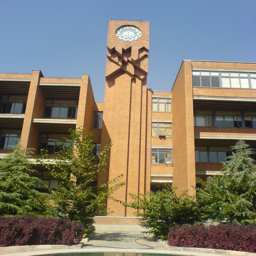

In [ ]:
first_img

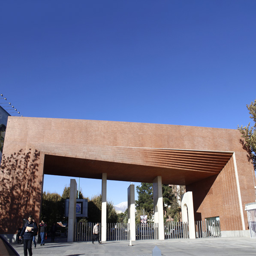

In [ ]:
second_img

Convolutions have some interesting usages in image processing. For example, you can extract edges from an image by applying a convolution with a kernel that detects edges. Or you can convolve a specific kernel with your image to make it grayscale or blurred! Look at the definitions below:

__Edge Detection Kernel__:

_Sobel_ is one of the most famous edge detection kernels. It has two kernels, one for detecting vertical edges and the other for horizontal edges. You can see the kernels below:
$$
\text{Sobel}_x = \begin{bmatrix}
-1 & 0 & 1 \\
-2 & 0 & 2 \\
-1 & 0 & 1
\end{bmatrix}
$$

$$
\text{Sobel}_y = \begin{bmatrix}
-1 & -2 & -1 \\
0 & 0 & 0 \\
1 & 2 & 1
\end{bmatrix}
$$


__Grayscale Kernel__:

You can simply convolve the image with the following kernel to make it grayscale:

$$
\text{Grayscale\_across\_R} = \begin{bmatrix}
0 & 0 & 0 \\
0 & 0.3 & 0 \\
0 & 0 & 0
\end{bmatrix}
$$

$$
\text{Grayscale\_across\_G} = \begin{bmatrix}
0 & 0 & 0 \\
0 & 0.6 & 0 \\
0 & 0 & 0
\end{bmatrix}
$$

$$
\text{Grayscale\_across\_B} = \begin{bmatrix}
0 & 0 & 0 \\
0 & 0.1 & 0 \\
0 & 0 & 0
\end{bmatrix}
$$

(Convolve each kernel with its corresponding channel)

__Blurring Kernel__:

One of the famous kernels to blur an image is _Gaussian Blur_. You can see the kernel below:

$$
\text{Gaussian\_Blur} = \frac{1}{16} \times \begin{bmatrix}
1 & 2 & 1 \\
2 & 4 & 2 \\
1 & 2 & 1
\end{bmatrix}
$$


In [ ]:
import numpy as np

# Kernels
Sobelx = np.array([[-1, 0, 1],
                   [-2, 0, 2],
                   [-1, 0, 1]])

Sobely = np.array([[-1, -2, -1],
                   [0, 0, 0],
                   [1, 2, 1]])

Grayscale_across_R = np.array([[0, 0, 0],
                               [0, 0.3, 0],
                               [0, 0, 0]])

Grayscale_across_G = np.array([[0, 0, 0],
                               [0, 0.6, 0],
                               [0, 0, 0]])

Grayscale_across_B = np.array([[0, 0, 0],
                               [0, 0.1, 0],
                               [0, 0, 0]])

Gaussian_Blur = np.array([[1, 2, 1],
                          [2, 4, 2],
                          [1, 2, 1]]) / 16


In [ ]:
img_size = 256

x = np.zeros((2, 3, img_size, img_size))
x[0] = np.array(first_img).transpose(2, 0, 1)
x[1] = np.array(second_img).transpose(2, 0, 1)

num_filters = 4
filter_size = 3

w = np.zeros((num_filters, 3, filter_size, filter_size))

# Assign each filter kernel to the corresponding position


w[0, 0, :, :] = Grayscale_across_R
w[0, 1, :, :] = Grayscale_across_G
w[0, 2, :, :] = Grayscale_across_B

w[1, :, :, :] = Sobelx
w[2, :, :, :] = Sobely
w[3, :, :, :] = Gaussian_Blur

b = np.array([0, 128, 128, 0])

conv = MyConv(stride=1, padding=1)
out = conv.forward(x, w, b)
out.shape

(2, 4, 256, 256)

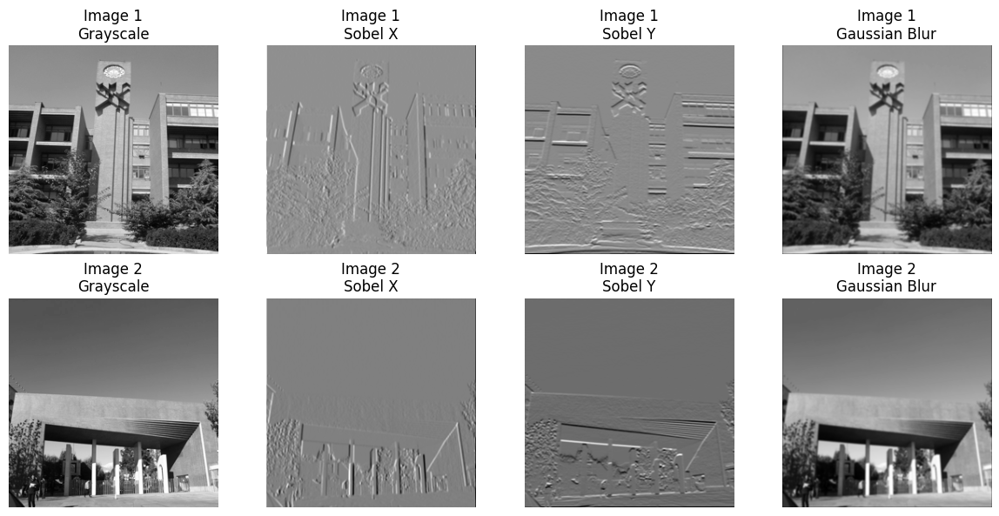

In [ ]:
import matplotlib.pyplot as plt

# Assuming `out` is your data with shape (2, 4, 256, 256)

num_images = out.shape[0]  # 2
num_channels = out.shape[1]  # 4
image_height = out.shape[2]  # 256
image_width = out.shape[3]   # 256

# Define labels for each channel
channel_labels = ['Grayscale', 'Sobel X', 'Sobel Y', 'Gaussian Blur']

plt.figure(figsize=(12, 6))

# Iterate through each image and each channel to plot
for i in range(num_images):
    for j in range(num_channels):
        plt.subplot(num_images, num_channels, i * num_channels + j + 1)
        plt.imshow(out[i, j], cmap='gray')  # Assuming grayscale images
        plt.title(f'Image {i+1}\n{channel_labels[j]}')
        plt.axis('off')

plt.tight_layout()
plt.show()


Now that we understood how Convolution works, we proceed further to use it in our models to perform a desired and specific task! We can use PyTorch's `Conv2D` layer from now on, because we understood how Convolutions work, behind the scene!

## Section 2: Neural Style Transfer (90 points)

In this part, we are going to implement a famous technique in the field of _Computer Vision_ called __Neural Style Transfer__. This technique is used to apply the style of a specific image to another image. For example, you can apply the style of a famous painting to your photo! Let's get started!

### 2.1 - Importing Libraries

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

from PIL import Image
import matplotlib.pyplot as plt

import torchvision.transforms as transforms
from torchvision.models import vgg19, VGG19_Weights

import copy

In [ ]:
device = torch.device(
    "cuda"
    if torch.cuda.is_available()
    else "mps" if torch.backends.mps.is_available() else "cpu"
)
torch.set_default_device(device)
device

device(type='cuda')

### 2.2 - Loading Images and doing some Preprocessing (5/90 pts)

In this part, you should load the content and style images and preprocess them. Preprocessing includes resizing the images to a specific size, normalizing them, and converting them to PyTorch tensors. You can use `torchvision.transforms` to do these tasks.

In [ ]:
img_size = 512 if not device == "cpu" else 256

transform = transforms.Compose([
    transforms.Resize((img_size, img_size)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])



In [ ]:
style_image_path = "/content/Images/Neural_Transfer/style.jpeg"
content_image_path = "/content/Images/Neural_Transfer/Content.jpeg"

# Load and preprocess the style image
style_image = Image.open(style_image_path).convert('RGB')
style_image = transform(style_image).unsqueeze(0).to(device)

# Load and preprocess the content image
content_image = Image.open(content_image_path).convert('RGB')
content_image = transform(content_image).unsqueeze(0).to(device)

# Print the sizes of the preprocessed images
print("Style image size:", style_image.size())
print("Content image size:", content_image.size())

Style image size: torch.Size([1, 3, 512, 512])
Content image size: torch.Size([1, 3, 512, 512])


Here, you should implement a helper function to show you images (which are now in form of pytorch tensors) in the notebook. You can use `torchvision.transforms.ToPILImage` to convert a tensor to a PIL image.

In [ ]:
import torch
import torchvision.transforms as transforms
import matplotlib.pyplot as plt

unnormalize = transforms.Normalize(
    mean=[-0.485 / 0.229, -0.456 / 0.224, -0.406 / 0.225],
    std=[1 / 0.229, 1 / 0.224, 1 / 0.225]
)

def imshow(tensor, title=None, normalized=True):
    unloader = transforms.ToPILImage()
    if normalized:
        tensor = unnormalize(tensor)
    image = tensor.cpu().clone()
    image = image.squeeze(0)
    image = unloader(image)
    plt.imshow(image)
    if title is not None:
        plt.title(title)
    plt.xticks([])
    plt.yticks([])
    plt.show()

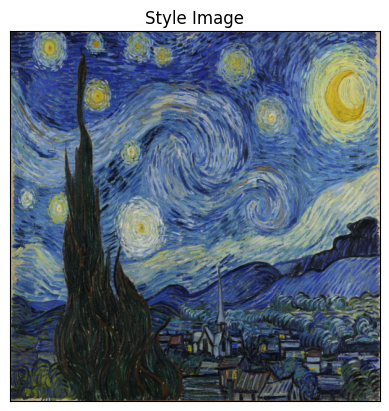

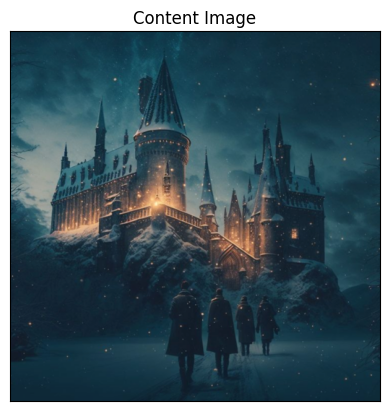

In [ ]:
imshow(style_image, title='Style Image')
imshow(content_image, title='Content Image')

### 2.2 - VGG19 Model (15/90 pts)

One of the important parts of Neural Style Transfer is to use a pre-trained model to extract features from the content and style images. Here, we are going to use a pre-trained VGG19 model to extract features from the images. You can use `torchvision.models.vgg19` to load the model. You should also freeze the weights of the model to prevent them from updating during the optimization process.

<div style="text-align:center;">
  <img src="./Images/VGG-19.png" />
</div>

But what is VGG model? Let's see with a simple experiment:

In [ ]:
import certifi
import os

os.environ['SSL_CERT_FILE'] = certifi.where()

Here, please load `VGG19` model from `torchvision.models` and see the architecture of the model. You may need models `features` and `classifier` part stored seperately as we will discuss these both parts.

In [ ]:
import torch
from torchvision.models import vgg19


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

vgg_model = vgg19(pretrained=True).to(device)

vgg_model_features = vgg_model.features.eval()
vgg_model_classifier = vgg_model.classifier.eval()

vgg_model_features.to(device)
vgg_model_classifier.to(device)


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth
100%|██████████| 548M/548M [00:08<00:00, 67.6MB/s]


Sequential(
  (0): Linear(in_features=25088, out_features=4096, bias=True)
  (1): ReLU(inplace=True)
  (2): Dropout(p=0.5, inplace=False)
  (3): Linear(in_features=4096, out_features=4096, bias=True)
  (4): ReLU(inplace=True)
  (5): Dropout(p=0.5, inplace=False)
  (6): Linear(in_features=4096, out_features=1000, bias=True)
)

In [ ]:
import torchsummary

torchsummary.summary(vgg_model_features, input_size=(3, 512, 512))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 512, 512]           1,792
              ReLU-2         [-1, 64, 512, 512]               0
            Conv2d-3         [-1, 64, 512, 512]          36,928
              ReLU-4         [-1, 64, 512, 512]               0
         MaxPool2d-5         [-1, 64, 256, 256]               0
            Conv2d-6        [-1, 128, 256, 256]          73,856
              ReLU-7        [-1, 128, 256, 256]               0
            Conv2d-8        [-1, 128, 256, 256]         147,584
              ReLU-9        [-1, 128, 256, 256]               0
        MaxPool2d-10        [-1, 128, 128, 128]               0
           Conv2d-11        [-1, 256, 128, 128]         295,168
             ReLU-12        [-1, 256, 128, 128]               0
           Conv2d-13        [-1, 256, 128, 128]         590,080
             ReLU-14        [-1, 256, 1

Please briefly explain what is a VGG model used for and what does each `features` and `classifier` part, represent?

**Your Answer:**

### VGG Model

The VGG model is a type of Convolutional Neural Network (CNN) that is widely used for image classification and recognition tasks. It was introduced by the Visual Geometry Group (VGG) at the University of Oxford in their paper "Very Deep Convolutional Networks for Large-Scale Image Recognition" in 2014.


- **Features Part**: Responsible for extracting and learning features from the input images through convolution, activation, and pooling operations.
- **Classifier Part**: Interprets the high-level features and makes the final classification through fully connected and softmax layers.

The VGG model's structure, with its deep architecture and small 3x3 filters, enables it to learn intricate details and achieve high accuracy in image recognition tasks.


#### Features Part

1. **Convolutional Layers**: These layers apply a set of filters to the input image to extract features. Each filter detects different patterns such as edges, textures, or specific shapes. The output of a convolutional layer is known as a feature map.

2. **ReLU Activation**: After each convolutional layer, a Rectified Linear Unit (ReLU) activation function is applied to introduce non-linearity into the model, allowing it to learn more complex patterns.

3. **Max Pooling Layers**: These layers reduce the spatial dimensions (height and width) of the feature maps, while retaining the most important features. This process, known as down-sampling, helps in reducing the computational complexity and controlling overfitting.

#### Classifier Part

1. **Fully Connected Layers**: These layers are densely connected layers that take the high-level features learned by the convolutional layers and interpret them to make the final classification. Each neuron in a fully connected layer is connected to every neuron in the previous layer.

2. **Softmax Layer**: The final layer of the classifier is typically a Softmax layer that outputs a probability distribution over the possible classes. This allows the model to make predictions by selecting the class with the highest probability.



Now, we are going to give a sample image `Images/Neural_Transfer/Car.jpeg` to the model, see the output for classification and also visualize the feature maps (outputs of each convolutional layer) to see what's going on!

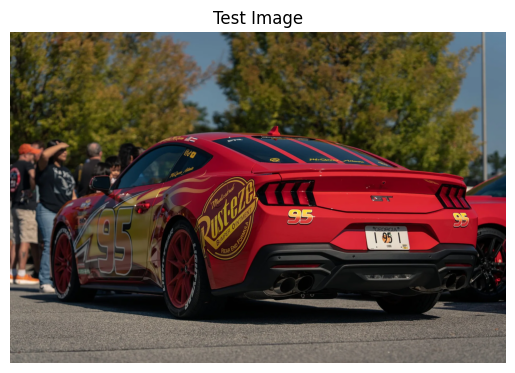

Predicted class number: 817


In [ ]:

vgg_test_image = Image.open("./Images/Neural_Transfer/Car.jpeg")


plt.imshow(vgg_test_image)
plt.title("Test Image")
plt.axis('off')
plt.show()


preprocess_vgg = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])


input_tensor = preprocess_vgg(vgg_test_image)
input_batch = input_tensor.unsqueeze(0).to(device)


with torch.no_grad():
    output = vgg_model(input_batch)

# Print the predicted class number
predicted_class = output.argmax(dim=1).item()
print("Predicted class number:", predicted_class)

As you can see, the output of the classifier is an integer. This integer is actually the **class number** in _Image Net_ dataset. Let's get the name of the class:

In [ ]:
import requests

class_idx = requests.get(
    "https://raw.githubusercontent.com/anishathalye/imagenet-simple-labels/master/imagenet-simple-labels.json"
).json()

# Get the class name
class_name = class_idx[predicted_class]

print(f"Predicted class: {class_name}")

Predicted class: sports car


Now that we understood the architecture of VGG, and also the output of its classifier, it's time to extract features from the images! And see what's going on in the feature maps!

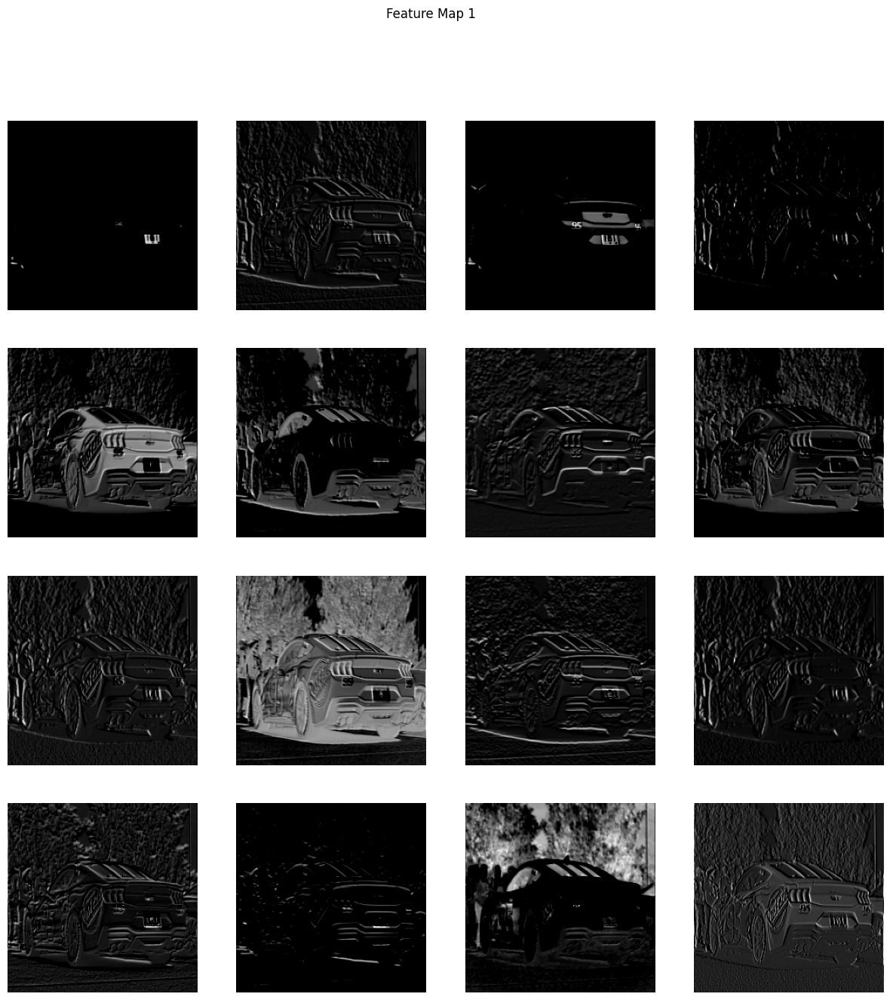

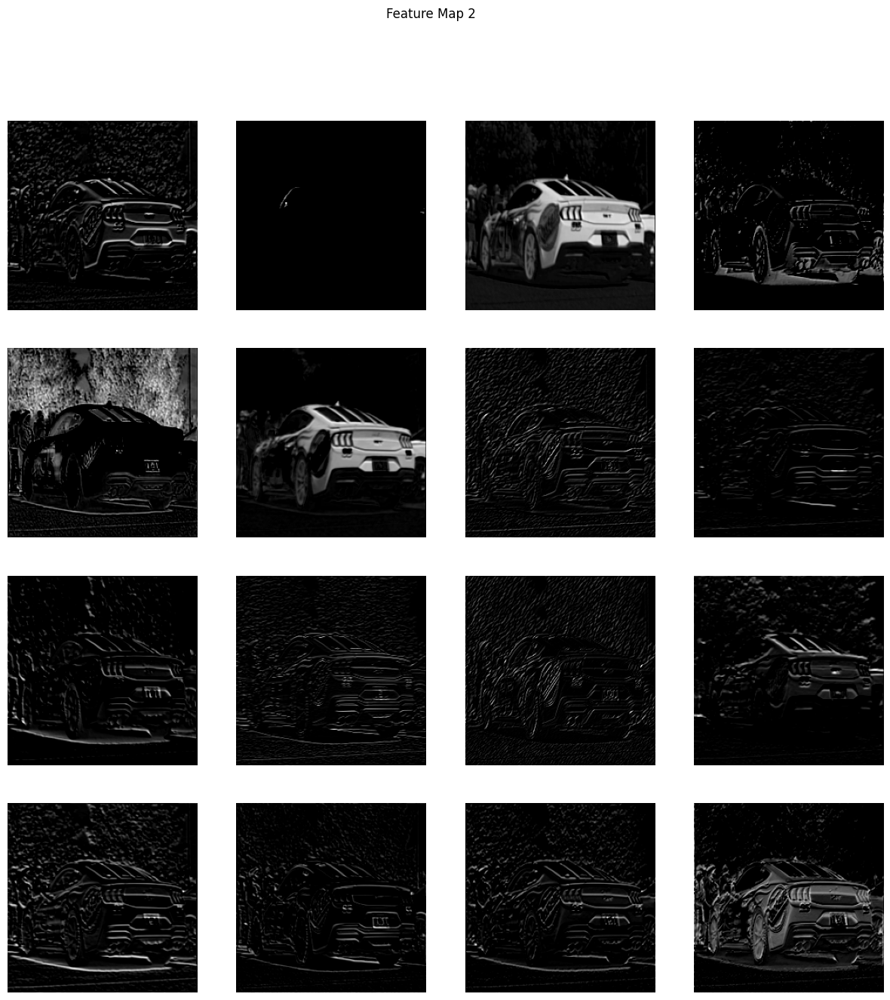

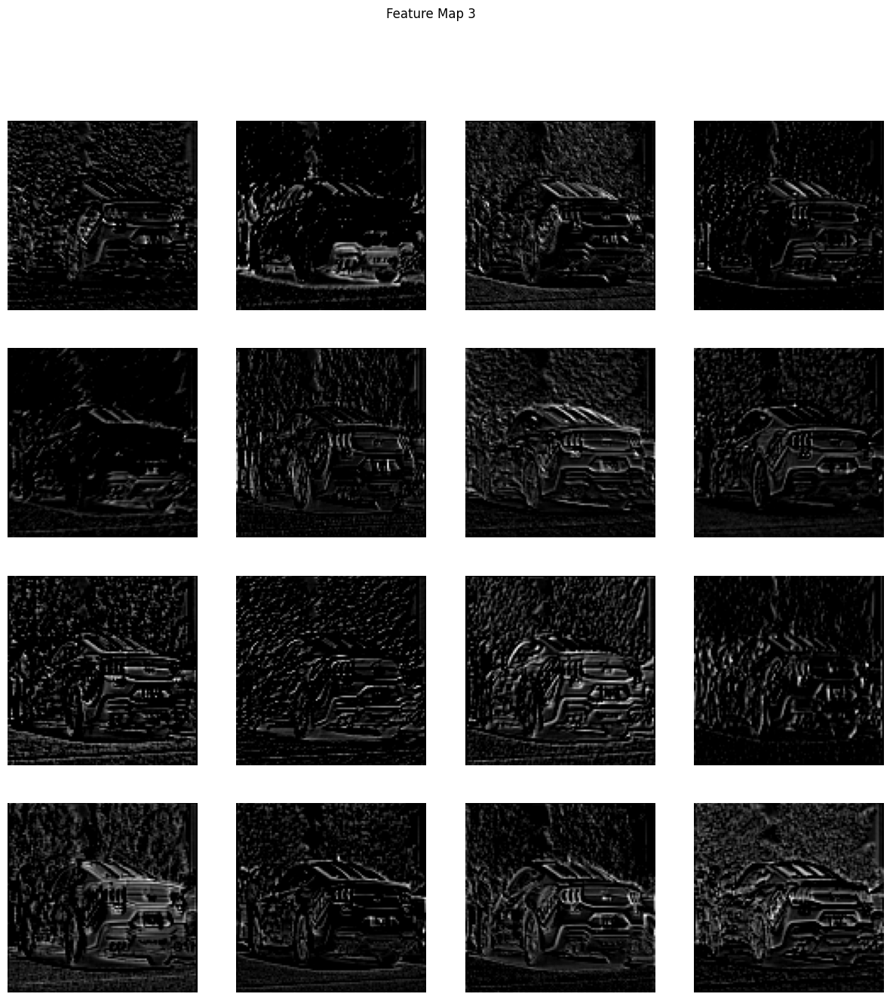

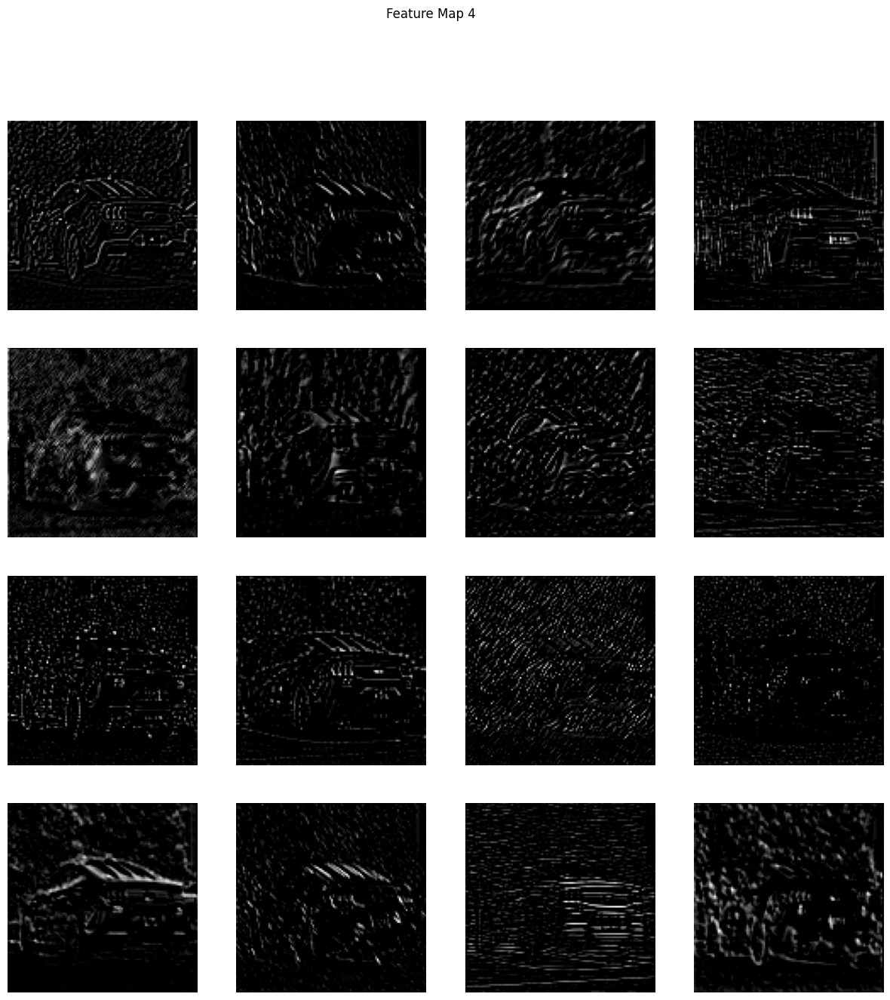

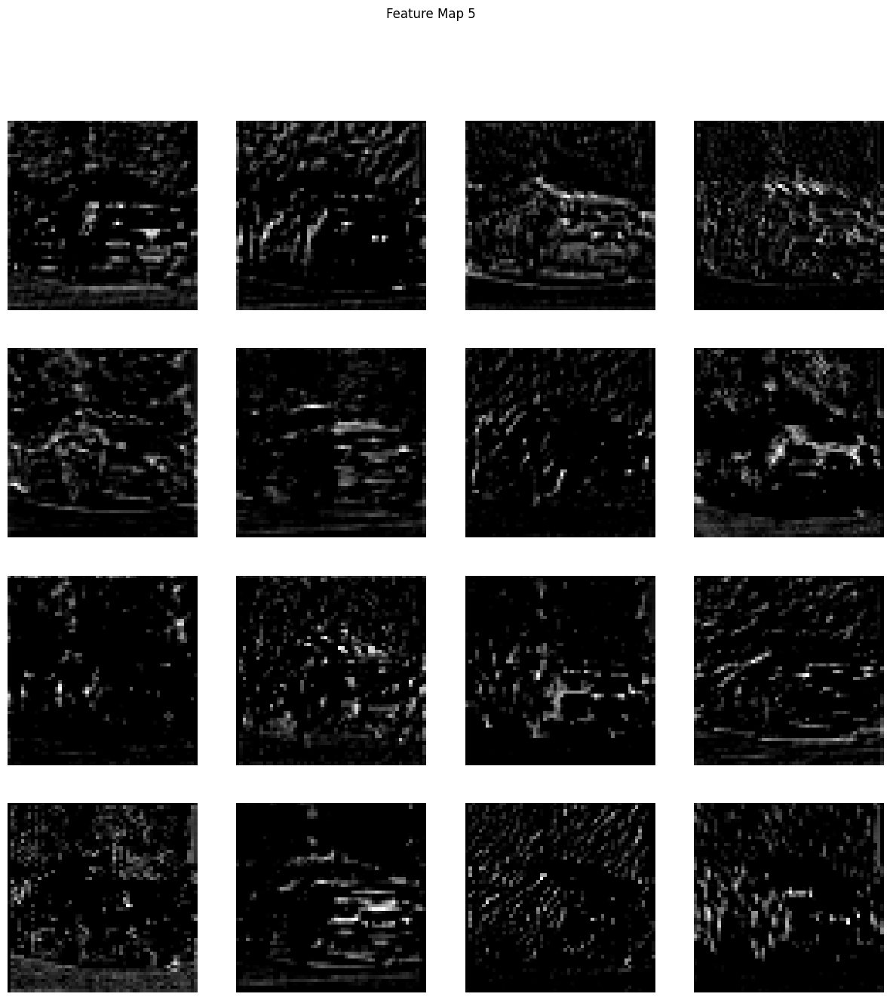

...

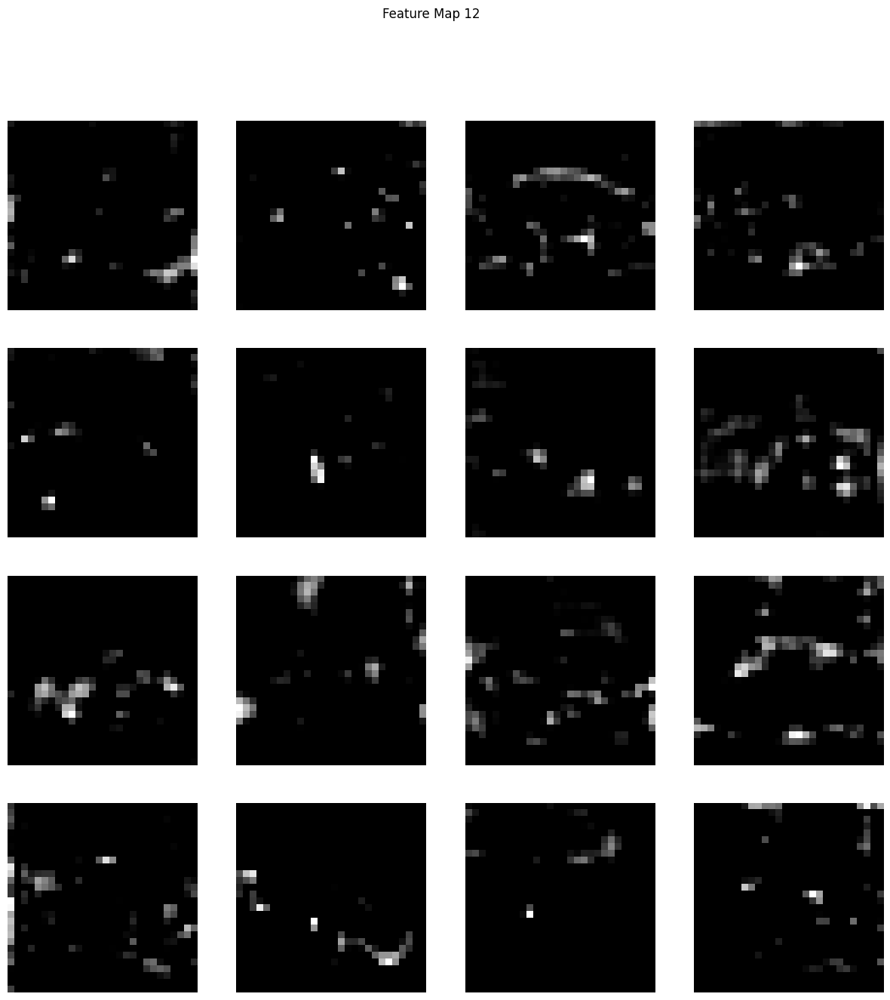

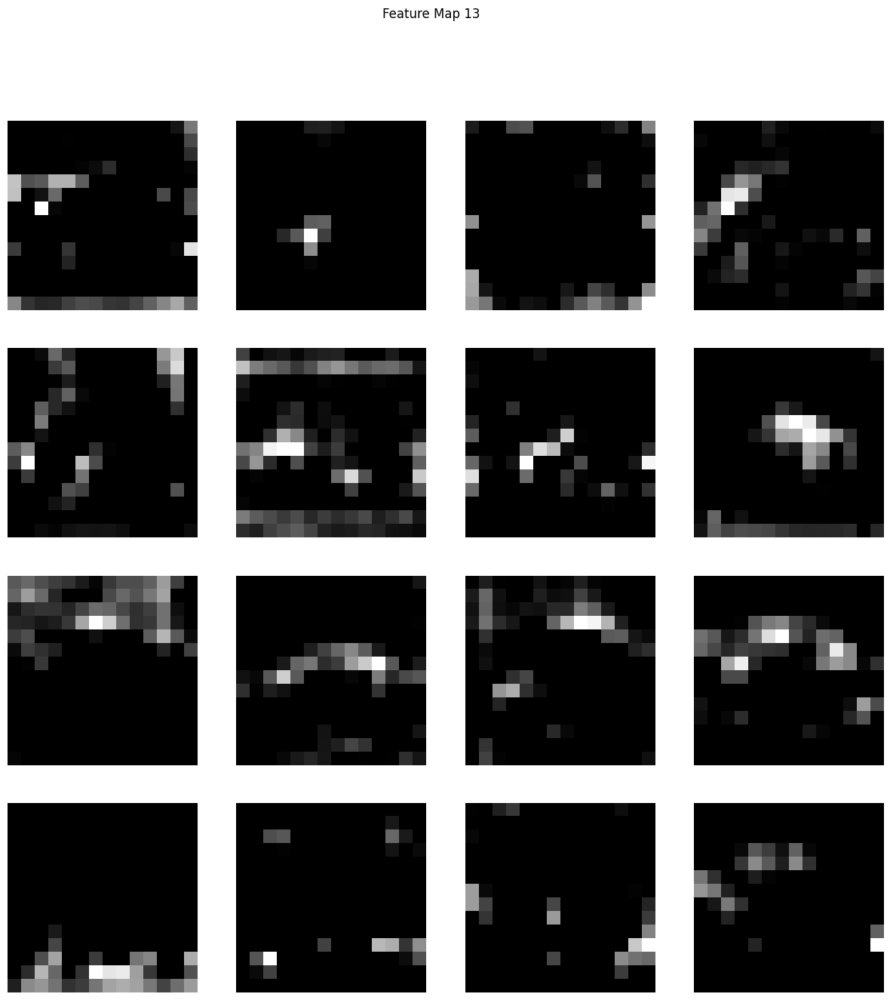

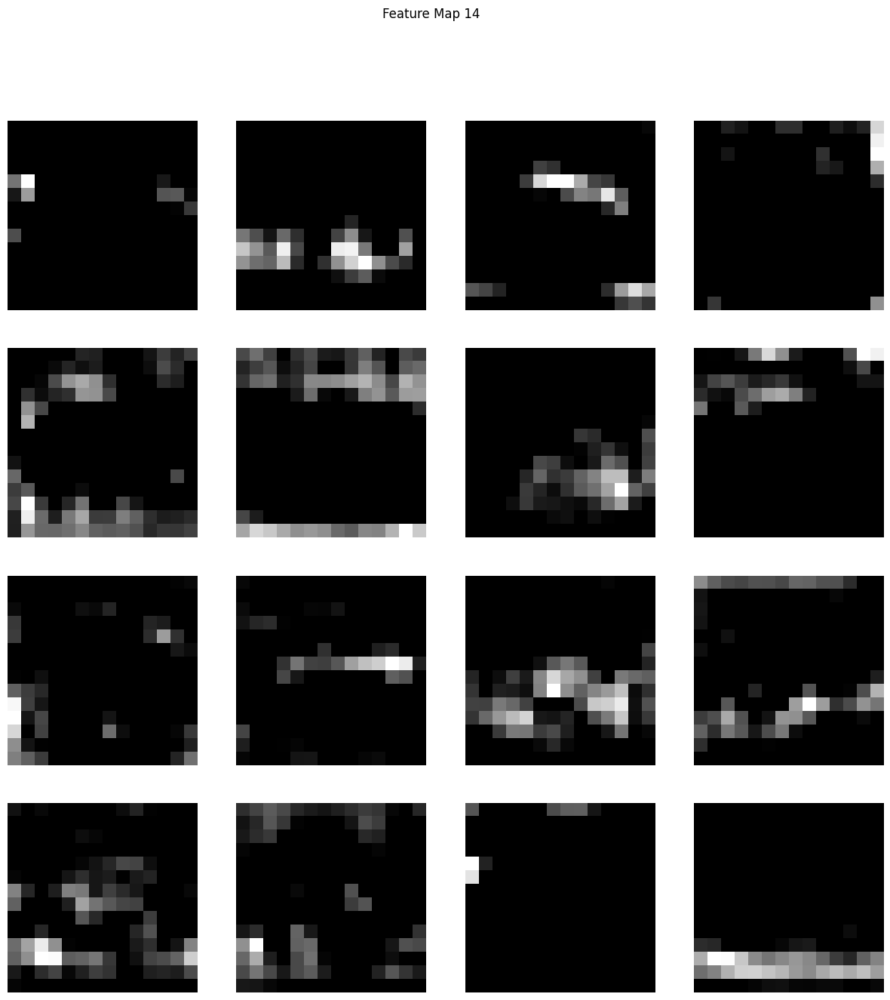

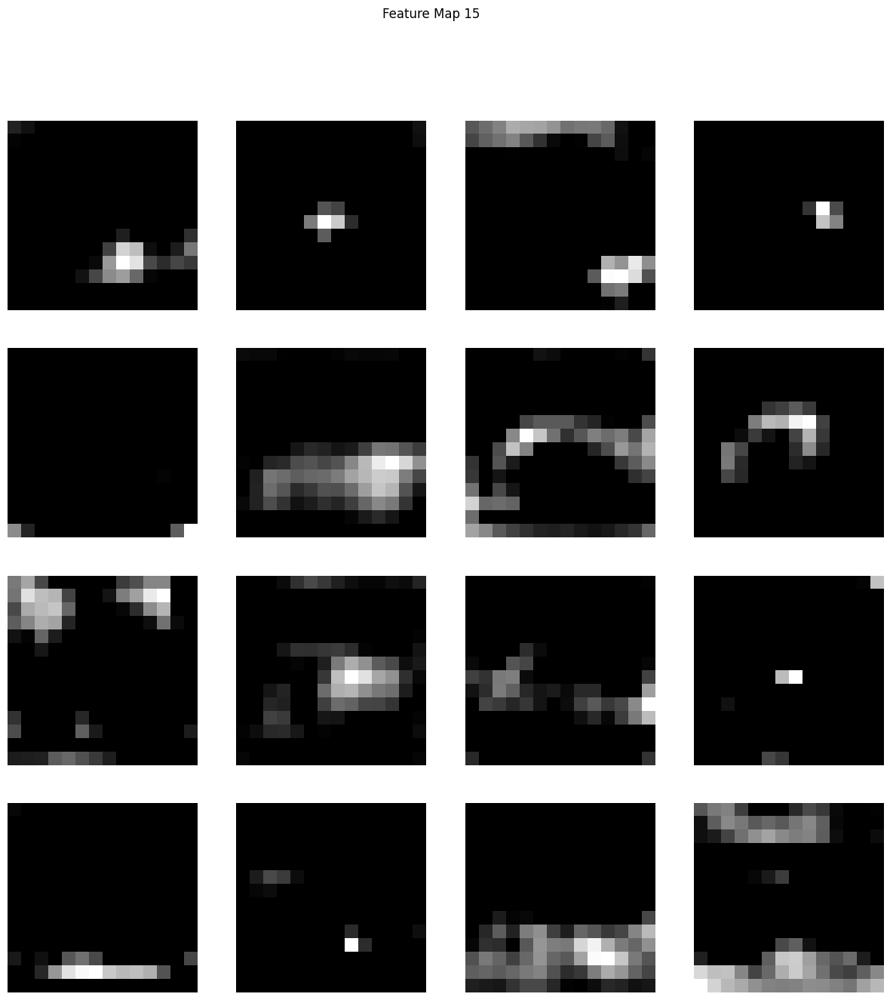

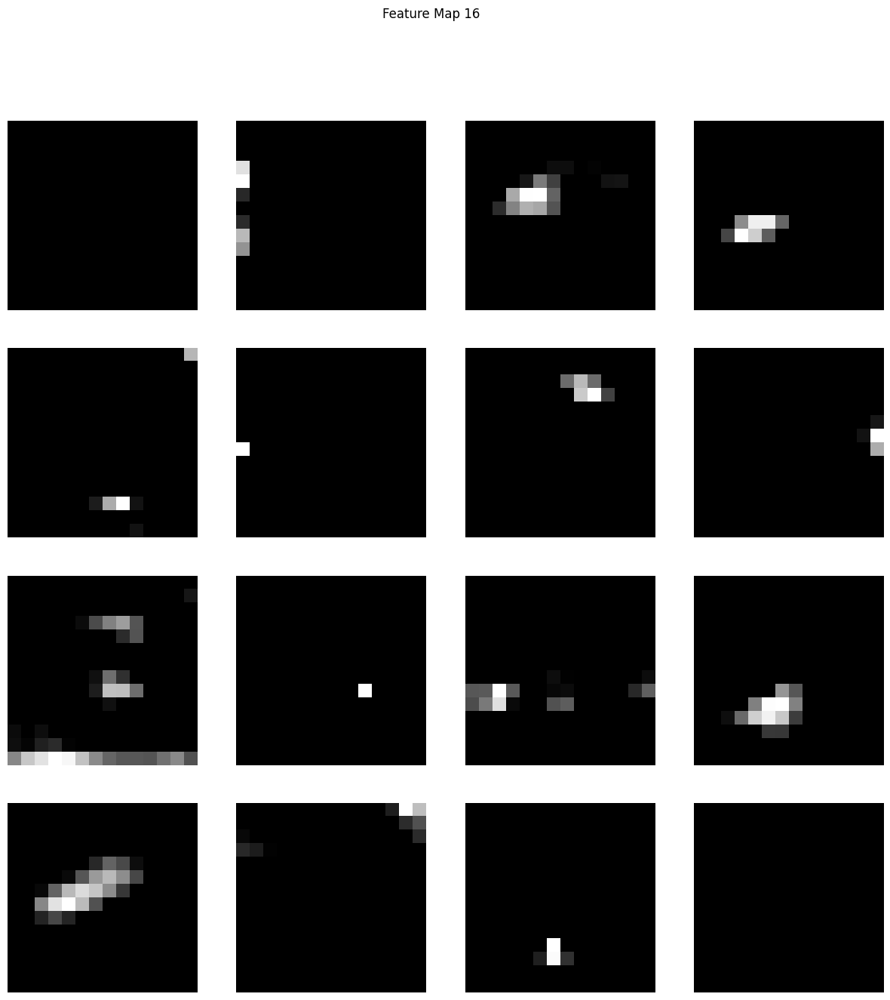

In [ ]:
with torch.no_grad():
    x = input_batch
    feature_maps = []
    for layer in vgg_model.features:
        x = layer(x)
        if isinstance(layer, torch.nn.Conv2d):
            feature_maps.append(x)

# Visualize the first 16 feature maps of each Conv2D layer
for idx, fmap in enumerate(feature_maps):
    plt.figure(figsize=(15, 15))
    plt.suptitle(f'Feature Map {idx + 1}')
    for i in range(min(16, fmap.shape[1])):  # Display up to 16 feature maps
        plt.subplot(4, 4, i + 1)
        plt.imshow(fmap[0, i].cpu(), cmap='gist_gray')
        plt.axis('off')
    plt.show()

It's fun too look under the hood, isn't it? As you can see, we can guess what are the learned features in each layer if the network (at least in the first layers). For example, in the first layer, the network learns to detect edges, and in the second layer, it learns to detect simple shapes. In the deeper layers, the network learns to detect more complex features.

### 2.3 - Content and Style Loss (15/90 pts)

In order to learn the correct image and keep the content of the original image while applying the style of the seconf image, we need 2 losses: 1. Content Loss and 2. Style Loss. Let's delve into each one!

**Content Loss** is responsible for keeping the content of the original image. It is calculated as the mean squared error between the feature maps of the original image and the generated image.

In [ ]:
class ContentLoss(nn.Module):
    def __init__(self, target):
        super(ContentLoss, self).__init__()
        self.target = target.detach()

    def forward(self, input):
        self.loss = F.mse_loss(input, self.target)
        return input


**Style Loss** is responsible for applying the style of the second image to the generated image. It is calculated as the mean squared error between the Gram matrices of the feature maps of the second image and the generated image.

In [30]:
def gram_calculator(input):
    """
    Calculate the normalized Gram Matrix of a given input
    """
    b, c, h, w = input.size()
    features = input.view(b, c, h * w)
    gram_matrix = torch.bmm(features, features.transpose(1, 2))
    gram_matrix = gram_matrix / (b * c * h * w)
    return gram_matrix


In [31]:
class StyleLoss(nn.Module):
    def __init__(self, target_feature):
        super(StyleLoss, self).__init__()
        self.target = gram_calculator(target_feature).detach()  # Calculate and store the Gram matrix of the target feature

    def forward(self, input):
        G = gram_calculator(input)  # Calculate the Gram matrix of the input
        self.loss = F.mse_loss(G, self.target)  # Calculate the mean squared error between the Gram matrices
        return input


Now, we use `features` part of the VGG model to extract features from the content and style images. Then, we calculate the content and style loss using the extracted features.

In [32]:
cnn = vgg19(weights=VGG19_Weights.IMAGENET1K_V1).features.to(device).eval()

In [33]:
cnn_normalization_mean = torch.tensor([0.485, 0.456, 0.406]).to(device)
cnn_normalization_std = torch.tensor([0.229, 0.224, 0.225]).to(device)

Please note that after which layers you should calculate the content loss and after which ones, you should calculate the style loss. Use the layer names you saw earlier in the `torchsummary` output for VGG19 model.

In [44]:
#GPT

default_content_layers = ['conv4']
default_style_layers = ['conv1', 'conv2', 'conv3', 'conv4', 'conv5']

def compute_loss_layers(cnn_model, style_image, content_image):
    # Define the normalization using the precomputed mean and std
    normalization_transform = transforms.Normalize(mean=cnn_normalization_mean, std=cnn_normalization_std).to(device)
    model_sequence = nn.Sequential(normalization_transform)

    content_loss_layers = []
    style_loss_layers = []

    layer_index = 0
    for layer in cnn_model.children():
        if isinstance(layer, nn.Conv2d):
            layer_index += 1
            layer_name = f'conv{layer_index}'
        elif isinstance(layer, nn.ReLU):
            layer_name = f'relu{layer_index}'
            layer = nn.ReLU(inplace=False)
        else:
            layer_name = f'other{layer_index}'

        model_sequence.add_module(layer_name, layer)

        if layer_name in default_content_layers:
            target_feature = model_sequence(content_image).detach()
            content_loss_layer = ContentLoss(target_feature)
            model_sequence.add_module(f'content_loss_{layer_index}', content_loss_layer)
            content_loss_layers.append(content_loss_layer)

        if layer_name in default_style_layers:
            target_feature = model_sequence(style_image).detach()
            style_loss_layer = StyleLoss(target_feature)
            model_sequence.add_module(f'style_loss_{layer_index}', style_loss_layer)
            style_loss_layers.append(style_loss_layer)

    # Find the position of the last loss layers
    final_content_loss_idx = max(idx for idx, layer in enumerate(model_sequence) if isinstance(layer, ContentLoss))
    final_style_loss_idx = max(idx for idx, layer in enumerate(model_sequence) if isinstance(layer, StyleLoss))
    final_loss_idx = max(final_content_loss_idx, final_style_loss_idx)

    # Truncate the model to include layers up to the last loss layer
    model_sequence = model_sequence[:final_loss_idx + 1]

    return model_sequence, content_loss_layers, style_loss_layers

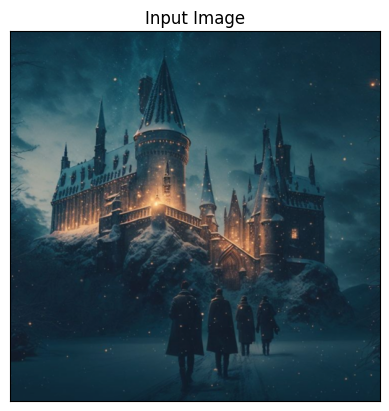

In [45]:
imshow(content_image, title='Input Image')

(15/90 pts) Now, we need to define our optimizer. We use `LBFGS` optimizer. Let's get familiar with this optimizer a little bit:

Let's use this optimizer to optimize a simple function $f(x) = x^2$. We want to find the minimum of this function using `LBFGS` optimizer. First, you should initialize a tensor $x$ with a random value. Then, you should define a closure function that calculates the value of the function and its gradient. Finally, you should use the `step` method of the optimizer to update the value of $x$.

And lastly, you should generate an animation using `matplotlib.animation` to show how the value of $x$ changes during optimization.

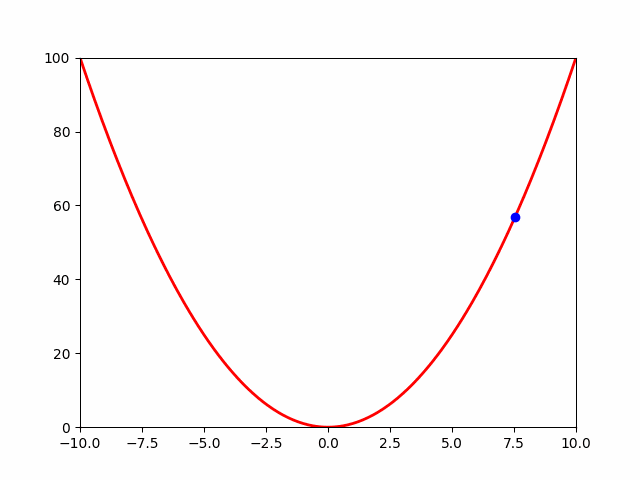

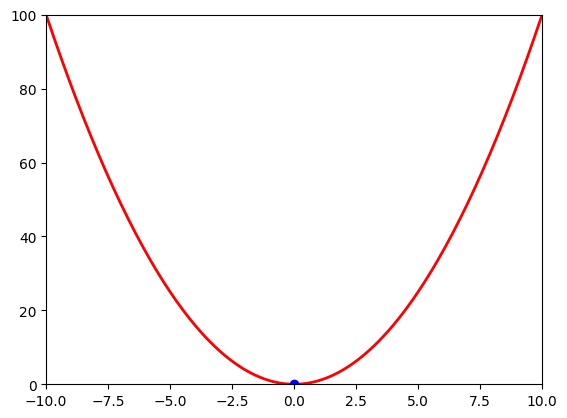

In [46]:
import torch
from torch.optim import LBFGS
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import Image as disimage, display
import random

# Define the quadratic function f(x) = x^2
def quadratic_function(x):
    return x ** 2

# Initialize a tensor with a single random value (e.g., between 5.0 and 10.0)
x = torch.tensor([random.uniform(5.0, 10.0)], requires_grad=True)

# Define the optimizer
optimizer = LBFGS([x], lr=0.1, max_iter=15)
x_values = []

# Define the closure function for the optimizer
def closure():
    optimizer.zero_grad()
    loss = quadratic_function(x)
    loss.backward()
    x_values.append(x.item())
    return loss

# Optimization loop
for _ in range(20):  # Run for a few iterations
    optimizer.step(closure)

# Generate the animation
fig, ax = plt.subplots()
line, = ax.plot([], [], 'r-', lw=2)  # Red line for the function plot
dot, = ax.plot([], [], 'bo')         # Blue dot for the current x value

ax.set_xlim(-10, 10)
ax.set_ylim(0, 100)

def init():
    line.set_data([], [])
    dot.set_data([], [])
    return line, dot

def update(num):
    x_plot = [i / 10.0 for i in range(-100, 101)]
    y_plot = [quadratic_function(torch.tensor([xi])).item() for xi in x_plot]
    line.set_data(x_plot, y_plot)
    dot.set_data([x_values[num]], [x_values[num] ** 2])
    return line, dot

ani = animation.FuncAnimation(fig, update, frames=len(x_values), init_func=init, blit=True)

# Save the animation as a GIF using Pillow writer
ani.save('animation.gif', writer='pillow')

# Display the saved animation
display(disimage(filename='animation.gif'))


(35/90 pts) Now, let's use this optimizer to optimize our `input_image` to minimize the content and style loss. You should define a closure function that calculates the content and style loss and their gradients. Then, you should use the `step` method of the optimizer to update the value of the `input_image`. Please also **note** that you should use a weighted sum of the content and style loss to optimize the input image. (weight of each loss is a hyperparameter)

Iteration 1:
Content Loss: 0.0
Style Loss: 4394.466796875
Total Loss: 4394.466796875


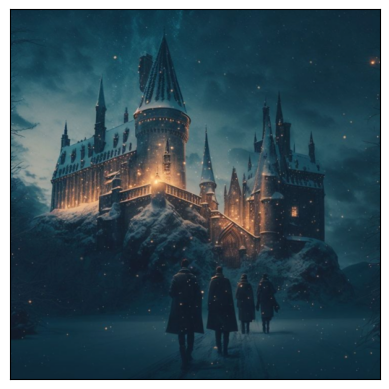

Iteration 51:
Content Loss: 21.5449275970459
Style Loss: 20.200769424438477
Total Loss: 41.745697021484375


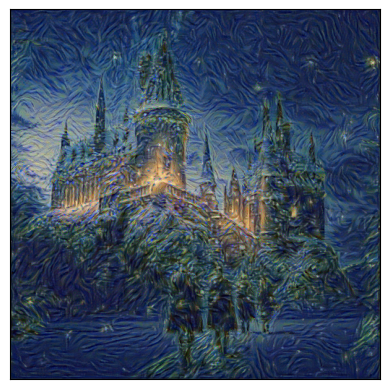

Iteration 101:
Content Loss: 17.301420211791992
Style Loss: 3.9427759647369385
Total Loss: 21.24419593811035


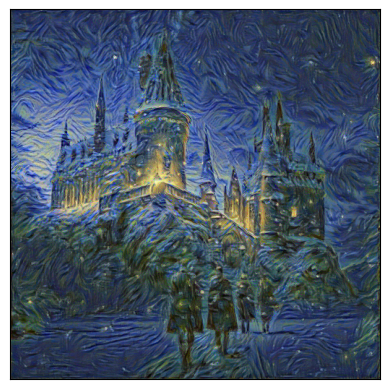

Iteration 151:
Content Loss: 14.472785949707031
Style Loss: 1.8428934812545776
Total Loss: 16.3156795501709


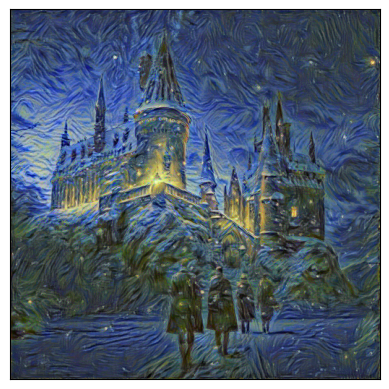

Iteration 201:
Content Loss: 12.791582107543945
Style Loss: 1.4315918684005737
Total Loss: 14.223174095153809


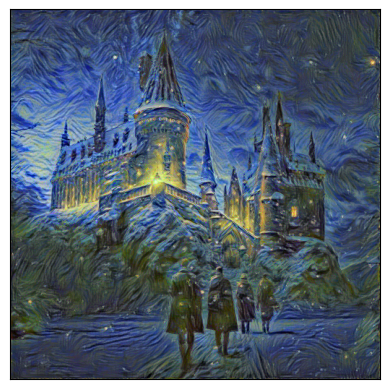

Iteration 251:
Content Loss: 11.710023880004883
Style Loss: 1.2510550022125244
Total Loss: 12.961078643798828


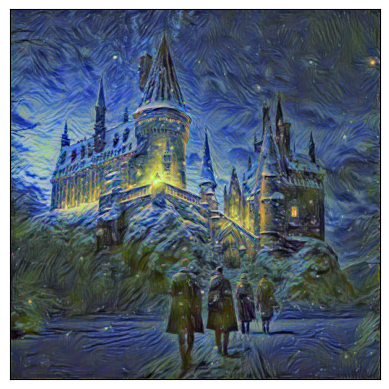

Iteration 301:
Content Loss: 11.060840606689453
Style Loss: 1.1125078201293945
Total Loss: 12.173348426818848


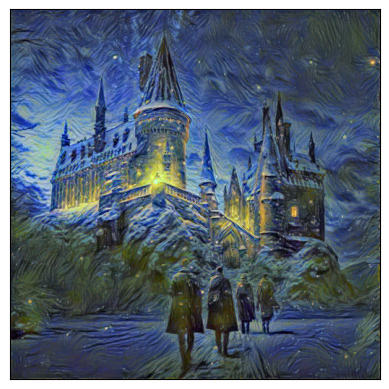

Iteration 351:
Content Loss: 10.638611793518066
Style Loss: 0.990170419216156
Total Loss: 11.628782272338867


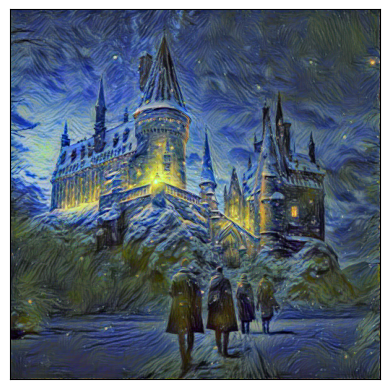

Iteration 401:
Content Loss: 10.351320266723633
Style Loss: 0.8866654634475708
Total Loss: 11.237985610961914


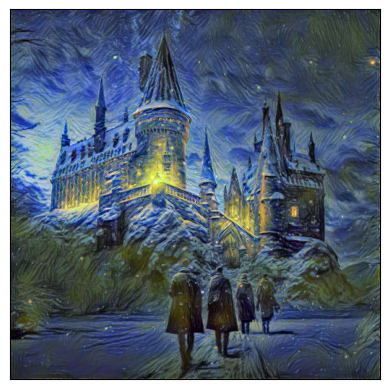

Iteration 451:
Content Loss: 10.157679557800293
Style Loss: 0.8042473793029785
Total Loss: 10.96192741394043


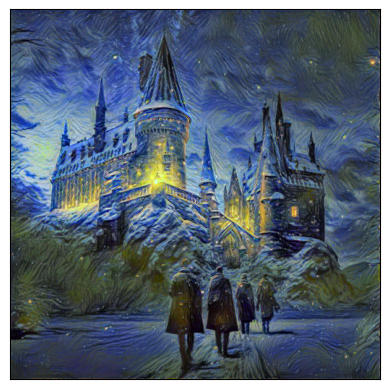

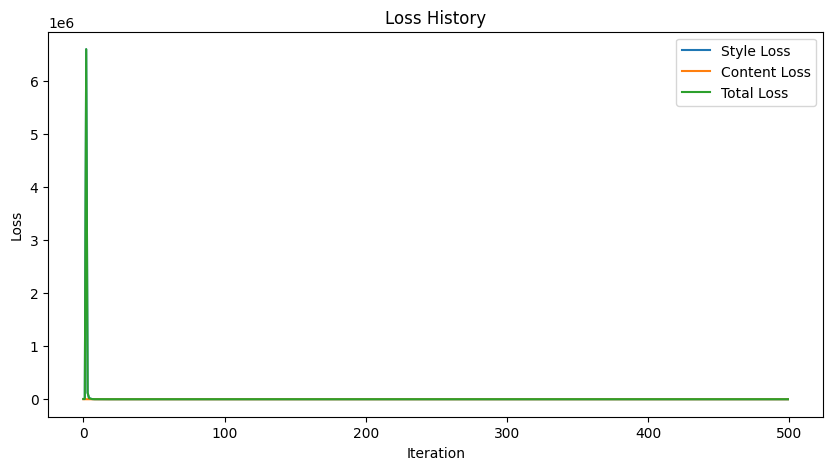

In [75]:
import torch
import torch.optim as optim
import matplotlib.pyplot as plt

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Adjust the style and content weights to be comparable
alpha = 1  # weight for content loss
beta = 350000  # weight for style loss

input_image = unnormalize(content_image).clone()
model, content_losses, style_losses = compute_loss_layers(cnn, unnormalize(style_image), unnormalize(content_image))

input_image = input_image.to(device)
model = model.to(device)
for cl in content_losses:
    cl.to(device)
for sl in style_losses:
    sl.to(device)

optimizer = optim.LBFGS([input_image.requires_grad_()])

num_iterations = 500
style_loss_history = []
content_loss_history = []
total_loss_history = []

# Use a global variable for iteration
global iteration
iteration = 0

def closure():
    global iteration  # Ensure we update the outer scope counter
    if iteration >= num_iterations:
        return
    optimizer.zero_grad()
    model(input_image)

    content_loss = 0
    style_loss = 0

    for cl in content_losses:
        content_loss += cl.loss
    for sl in style_losses:
        style_loss += sl.loss

    style_loss = beta * style_loss
    content_loss = alpha * content_loss

    total_loss = content_loss + style_loss
    total_loss.backward()

    style_loss_history.append(style_loss.item())
    content_loss_history.append(content_loss.item())
    total_loss_history.append(total_loss.item())

    iteration += 1  # Increment iteration counter

    with torch.no_grad():
        input_image.clamp_(0, 1)

    if iteration % 50 == 1:
        print(f"Iteration {iteration}:")
        print(f"Content Loss: {content_loss_history[-1]}")
        print(f"Style Loss: {style_loss_history[-1]}")
        print(f"Total Loss: {total_loss_history[-1]}")
        imshow(input_image.cpu(), normalized=False)

    return total_loss

while iteration < num_iterations:
    optimizer.step(closure)

plt.figure(figsize=(10, 5))
plt.plot(style_loss_history, label='Style Loss')
plt.plot(content_loss_history, label='Content Loss')
plt.plot(total_loss_history, label='Total Loss')
plt.xlabel('Iteration')
plt.ylabel('Loss')
plt.legend()
plt.title('Loss History')
plt.show()


Now, let's see the result of optimization process on our `input_image`.

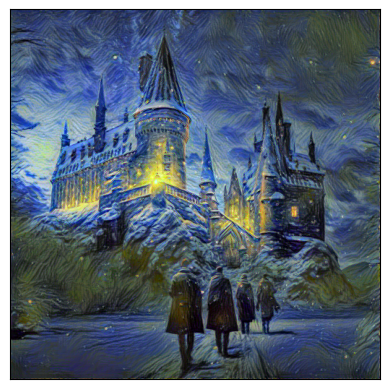

In [76]:
# Plot the final result
plt.figure()
imshow(input_image.cpu(), normalized=False)

(5/90 pts) Also, let's plot our `style_losses`, `content_losses` and `total_losses` to see how they change during the optimization process.

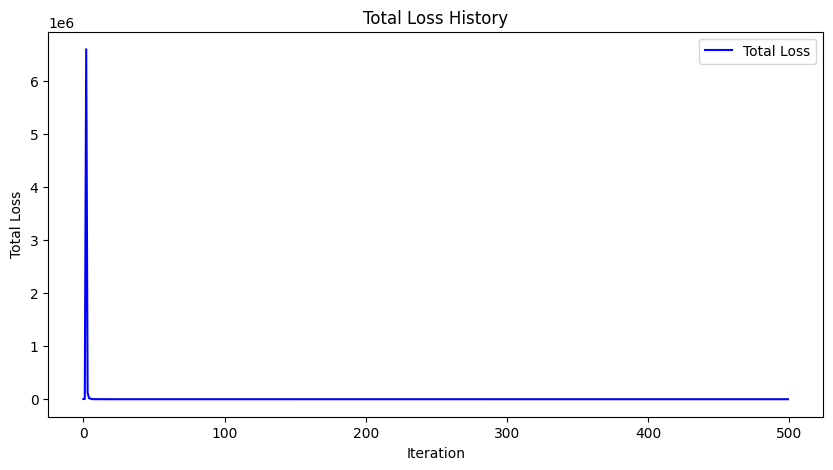

In [77]:
# Plot Total Loss
plt.figure(figsize=(10, 5))
plt.plot(total_loss_history, label='Total Loss', color='blue')
plt.xlabel('Iteration')
plt.ylabel('Total Loss')
plt.legend()
plt.title('Total Loss History')
plt.show()


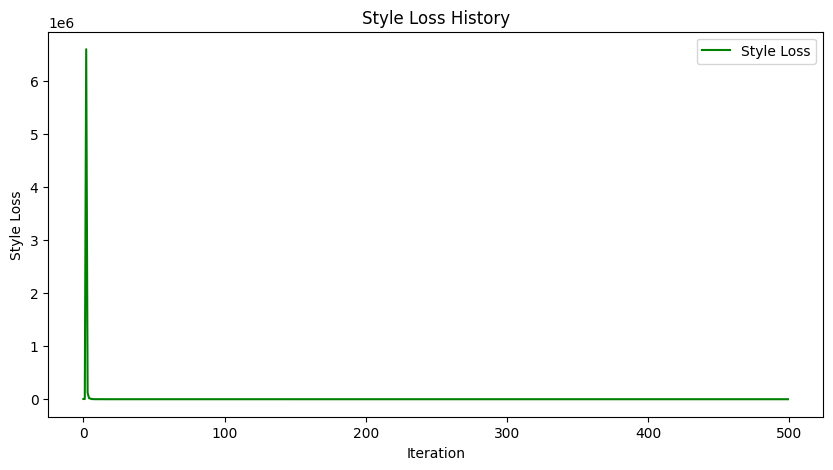

In [78]:
# Plot Style Loss
plt.figure(figsize=(10, 5))
plt.plot(style_loss_history, label='Style Loss', color='green')
plt.xlabel('Iteration')
plt.ylabel('Style Loss')
plt.legend()
plt.title('Style Loss History')
plt.show()


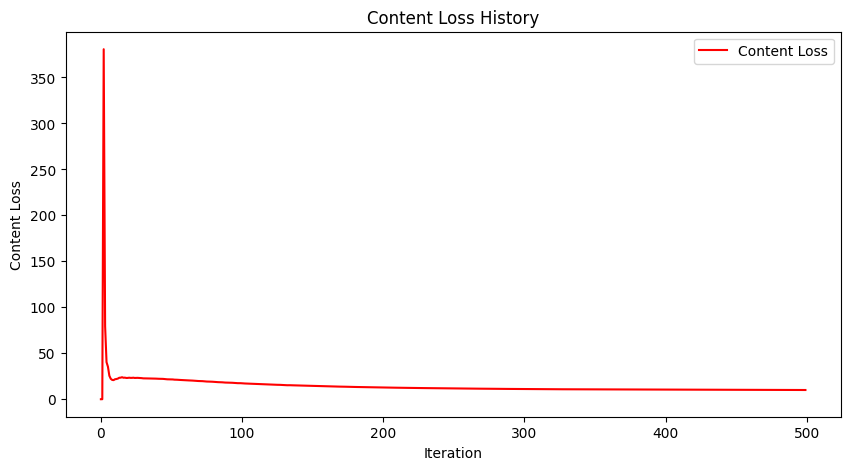

In [79]:
# Plot Content Loss
plt.figure(figsize=(10, 5))
plt.plot(content_loss_history, label='Content Loss', color='red')
plt.xlabel('Iteration')
plt.ylabel('Content Loss')
plt.legend()
plt.title('Content Loss History')
plt.show()
